In [1]:
import numpy as np
import random
import math
import torch
import pytorch_lightning as pl
pl.seed_everything(42)

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import cm
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgba
import seaborn as sns
sns.reset_orig()

Global seed set to 42


In [2]:
from graph_utils import *
from graph_generation import *
from graph_visualization import *
from variable_distributions import *

## Graph creation

In [3]:
N_VARS = 5

In [4]:
variables = [CausalVariable("%i" % i, prob_dist=None) for i in range(N_VARS)]
edges = np.array([[0, 1], [3, 4], [2, 4], [4, 0]])
print(edges)

[[0 1]
 [3 4]
 [2 4]
 [4 0]]


### Edge <=> Adjacency matrix conversion

In [5]:
adj_matrix = edges_to_adj_matrix(edges, num_vars=5)

In [6]:
print(adj_matrix)

[[False  True False False False]
 [False False False False False]
 [False False False False  True]
 [False False False False  True]
 [ True False False False False]]


In [7]:
adj_matrix_to_edges(adj_matrix)

array([[0, 1],
       [2, 4],
       [3, 4],
       [4, 0]])

In [8]:
variables, edges, adj_matrix, sorted_idxs = sort_graph_by_vars(variables, edges, adj_matrix)

In [9]:
print("Variables", [str(v) for v in variables])
print("Edges\n", edges)
print("Adj matrix\n", adj_matrix)
print("Sorting indices", sorted_idxs)

Variables ['CausalVariable 2', 'CausalVariable 3', 'CausalVariable 4', 'CausalVariable 0', 'CausalVariable 1']
Edges
 [[3 4]
 [1 2]
 [0 2]
 [2 3]]
Adj matrix
 [[False False  True False False]
 [False False  True False False]
 [False False False  True False]
 [False False False False  True]
 [False False False False False]]
Sorting indices [2, 3, 4, 0, 1]


In [10]:
graph = CausalDAG(variables, edges, adj_matrix)

In [11]:
print(graph)

CausalDAG with 5 variables [2,3,4,0,1] and 4 edges:
2 => 4
3 => 4
4 => 0
0 => 1



### Plotting

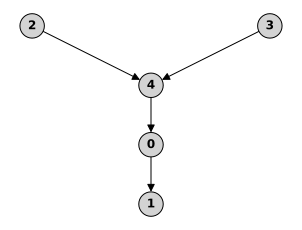

In [12]:
visualize_graph(graph, show_plot=True, figsize=(4,3))

In [13]:
graph2 = graph.get_intervened_graph({"0": 1})

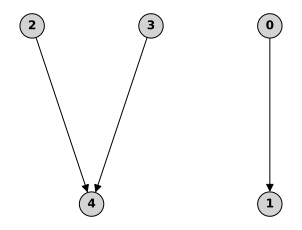

In [14]:
visualize_graph(graph2, show_plot=True, figsize=(4,3))

## Probability distributions

### Continuous

In [15]:
gaus_dist = get_random_gaussian(["A"], num_coeff=5, max_val=20)

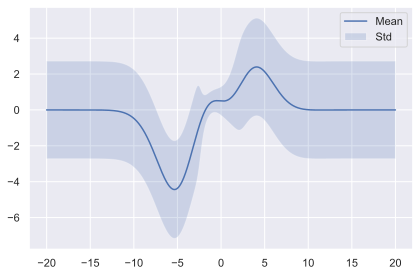

In [16]:
sns.set()
A = np.arange(-20, 20, 0.01)
mu, std = gaus_dist._get_params({"A": A})

plt.plot(A, mu, label="Mean")
plt.fill_between(A, mu+std, mu-std, label="Std", alpha=0.2)
plt.legend()
plt.tight_layout()
plt.show()
plt.close()
sns.reset_orig()

In [17]:
gaus_dist = get_random_gaussian(["A", "B"])

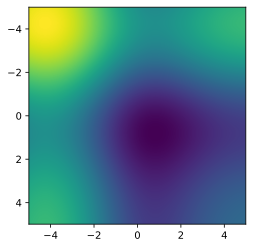

In [18]:
RANGE_A, RANGE_B = 5, 5
A = np.arange(-RANGE_A, RANGE_B, 0.01)
B = np.arange(-RANGE_A, RANGE_B, 0.01)
A, B = np.meshgrid(A, B)

mu, std = gaus_dist._get_params({"A": A, "B": B})
plt.imshow(mu, extent=(A.min(), A.max(), B.max(), B.min()))
plt.show()

In [19]:
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(A, B, mu, cmap=cm.viridis)
plt.show()

### Discrete

#### Multinomial Batch Sampling

In [20]:
p = np.array([[0.2, 0.7, 0.1], [1/3.]*3])
p_large = np.repeat(p[None], 100000, axis=0)

In [21]:
samples = multinomial_batch(p_large)
samples.shape

(100000, 2)

In [22]:
avgs = (samples[:,:,None] == np.arange(p.shape[-1])[None,None,:]).mean(axis=0)
print("Probabilities based on %i samples:\n" % samples.shape[0], avgs)
assert (np.abs(avgs - p) < 0.02).all()

Probabilities based on 100000 samples:
 [[0.19908 0.70071 0.10021]
 [0.33228 0.33446 0.33326]]


In [23]:
categ_dist = get_random_categorical(input_names=[], 
                                    input_num_categs=[], 
                                    num_categs=5)

In [24]:
%%time
_ = categ_dist.sample(inputs={}, batch_size=100000)

CPU times: user 11.6 ms, sys: 5.05 ms, total: 16.7 ms
Wall time: 15 ms


#### Independent inputs

In [25]:
A_CATEGS = 10
B_CATEGS = 10
C_CATEGS = 10
categ_dist = get_random_categorical(input_names=["A", "B"], 
                                    input_num_categs=[A_CATEGS, B_CATEGS], 
                                    num_categs=C_CATEGS, 
                                    inputs_independent=True)

In [26]:
vars(categ_dist.prob_func)

{'val_grids': [array([[0.08244627, 0.05170755, 0.12207557, 0.21868705, 0.07294618,
          0.09534405, 0.05969075, 0.13208649, 0.05398313, 0.11103297],
         [0.03850012, 0.03655174, 0.12989054, 0.16201178, 0.04553537,
          0.13918327, 0.04333165, 0.0729137 , 0.20300015, 0.12908166],
         [0.01420435, 0.23812125, 0.05045997, 0.01291515, 0.11095424,
          0.09408092, 0.0281286 , 0.06316112, 0.2644915 , 0.1234829 ],
         [0.28680416, 0.07121318, 0.05818516, 0.1923364 , 0.02187053,
          0.04011871, 0.10124856, 0.05369823, 0.12426405, 0.05026102],
         [0.28895781, 0.05652512, 0.11400057, 0.06355252, 0.07967219,
          0.02005943, 0.07932783, 0.22734721, 0.03918522, 0.03137209],
         [0.03861437, 0.0189325 , 0.31650914, 0.05284496, 0.28231026,
          0.10313843, 0.08469977, 0.05550479, 0.036835  , 0.01061076],
         [0.08169494, 0.08249004, 0.19406106, 0.09316279, 0.08153697,
          0.1131233 , 0.12918645, 0.0597613 , 0.10415647, 0.06082668],


In [27]:
A = np.arange(A_CATEGS, dtype=np.int32)
B = np.arange(B_CATEGS, dtype=np.int32)
prob_grid = np.zeros((A_CATEGS, B_CATEGS, C_CATEGS))
for a in A:
    for b in B:
        prob_grid[a, b] = categ_dist.prob_func(inputs={"A":a, "B":b}, batch_size=1)

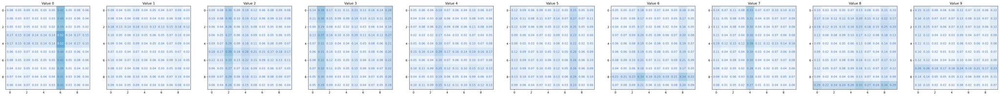

In [28]:
fig, ax = plt.subplots(1, C_CATEGS, figsize=(C_CATEGS*math.sqrt(A_CATEGS)*2, math.sqrt(B_CATEGS)*2))
for c in range(C_CATEGS):
    key_ax = ax[c]
    key_ax.imshow(prob_grid[:,:,c], cmap=cm.Blues, vmin=0.0, vmax=1.0)
    key_ax.set_title("Value %i" % c)
    # Loop over data dimensions and create text annotations.
    for a in A:
        for b in B:
            text = key_ax.text(b, a, "%.2f" % prob_grid[a,b,c],
                               ha="center", va="center", 
                               color="w" if prob_grid[a,b,c]>0.5 else "b")
plt.show()

In [29]:
categ_dist.sample(inputs={"A":np.array([0]), "B": np.array([0])}, batch_size=1)

array([2])

In [30]:
state_dict = categ_dist.prob_func.get_state_dict()
new_func = categ_dist.prob_func.__class__.load_from_state_dict(state_dict)
categ_dist.prob_func = new_func
prob_grid2 = np.zeros((A_CATEGS, B_CATEGS, C_CATEGS))
for a in A:
    for b in B:
        prob_grid2[a, b] = categ_dist.prob_func(inputs={"A":a, "B":b}, batch_size=1)
assert (prob_grid == prob_grid2).all()

#### NN distributions

In [31]:
categ_dist = get_random_categorical(input_names=["A", "B"], 
                                    input_num_categs=[A_CATEGS, B_CATEGS], 
                                    num_categs=C_CATEGS, 
                                    use_nn=True)

In [32]:
categ_dist.prob_func.get_state_dict()

{'embed_module': OrderedDict([('weight',
               tensor([[ 1.9269,  1.4873,  0.9007, -2.1055],
                       [ 0.6784, -1.2345, -0.0431, -1.6047],
                       [-0.7521,  1.6487, -0.3925, -1.4036],
                       [-0.7279, -0.5594, -0.7688,  0.7624],
                       [ 1.6423, -0.1596, -0.4974,  0.4396],
                       [-0.7581,  1.0783,  0.8008,  1.6806],
                       [ 1.2791,  1.2964,  0.6105,  1.3347],
                       [-0.2316,  0.0418, -0.2516,  0.8599],
                       [-1.3847, -0.8712, -0.2234,  1.7174],
                       [ 0.3189, -0.4245,  0.3057, -0.7746],
                       [-1.5576,  0.9956, -0.8798, -0.6011],
                       [-1.2742,  2.1228, -1.2347, -0.4879],
                       [-0.9138, -0.6581,  0.0780,  0.5258],
                       [-0.4880,  1.1914, -0.8140, -0.7360],
                       [-1.4032,  0.0360, -0.0635,  0.6756],
                       [-0.0978,  1.8446, -1

In [33]:
A = np.arange(A_CATEGS, dtype=np.int32)
B = np.arange(B_CATEGS, dtype=np.int32)
bb, aa = np.meshgrid(B, A)
prob_grid = categ_dist.prob_func(inputs={"A": aa, "B": bb}, batch_size=1)

In [34]:
prob_grid.shape

(10, 10, 10)

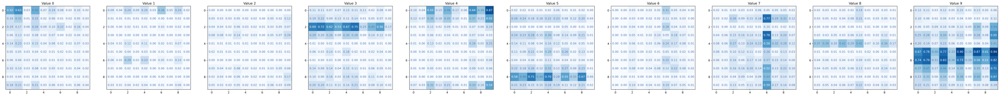

In [35]:
fig, ax = plt.subplots(1, C_CATEGS, figsize=(C_CATEGS*math.sqrt(A_CATEGS)*2, math.sqrt(B_CATEGS)*2))
for c in range(C_CATEGS):
    key_ax = ax[c]
    key_ax.imshow(prob_grid[:,:,c], cmap=cm.Blues, vmin=0.0, vmax=1.0)
    key_ax.set_title("Value %i" % c)
    # Loop over data dimensions and create text annotations.
    for a in A:
        for b in B:
            text = key_ax.text(b, a, "%.2f" % prob_grid[a,b,c],
                               ha="center", va="center", 
                               color="w" if prob_grid[a,b,c]>0.5 else "b")
plt.show()

In [36]:
state_dict = categ_dist.prob_func.get_state_dict()
new_func = categ_dist.prob_func.__class__.load_from_state_dict(state_dict)
categ_dist.prob_func = new_func
prob_grid2 = categ_dist.prob_func(inputs={"A": aa, "B": bb}, batch_size=1)
assert (prob_grid == prob_grid2).all()

## Generating random graphs

In [37]:
np.random.seed(42)
random.seed(42)

In [38]:
graph = generate_categorical_graph(num_vars=6,
                                   min_categs=2,
                                   max_categs=5,
                                   connected=True,
                                   graph_func=generate_random_graph,
                                   edge_prob=0.4,
                                   use_nn=True)

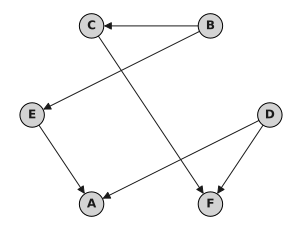

In [39]:
visualize_graph(graph, filename="example_graphs/example_graph_4.pdf", show_plot=True, figsize=(4,3), layout="circular")

In [40]:
print(graph)

CausalDAG with 6 variables [D,B,C,E,A,F] and 6 edges:
D => A,F
B => C,E
C => F
E => A



In [41]:
sample_vals = graph.sample()

In [42]:
sample_vals = graph.sample(interventions={"C": np.repeat(0, 1000)}, batch_size=1000)

In [43]:
sample_vals

{'D': array([3, 0, 1, 0, 1, 1, 1, 3, 1, 1, 2, 1, 3, 0, 3, 3, 1, 0, 3, 3, 3, 3,
        0, 1, 0, 3, 2, 1, 0, 1, 1, 3, 2, 3, 2, 0, 3, 3, 2, 3, 2, 2, 1, 0,
        0, 0, 2, 1, 2, 3, 1, 1, 3, 1, 0, 1, 1, 3, 3, 2, 3, 3, 1, 3, 2, 3,
        3, 1, 0, 1, 1, 3, 3, 0, 2, 1, 1, 0, 1, 3, 1, 2, 3, 1, 3, 3, 1, 2,
        1, 1, 0, 2, 2, 0, 1, 3, 1, 1, 2, 3, 1, 3, 3, 1, 3, 1, 2, 2, 2, 0,
        3, 1, 1, 0, 2, 3, 0, 2, 1, 3, 1, 3, 1, 3, 1, 1, 0, 3, 3, 1, 3, 3,
        2, 2, 1, 0, 3, 3, 2, 1, 1, 3, 3, 3, 3, 2, 0, 1, 3, 2, 0, 0, 3, 0,
        1, 2, 3, 3, 1, 3, 1, 1, 3, 3, 3, 3, 2, 0, 1, 1, 1, 3, 1, 3, 2, 3,
        2, 2, 2, 1, 3, 1, 0, 3, 1, 3, 3, 3, 1, 0, 3, 1, 3, 3, 3, 1, 1, 3,
        1, 1, 2, 3, 3, 2, 0, 2, 3, 1, 2, 3, 3, 3, 3, 1, 1, 3, 3, 3, 3, 2,
        2, 3, 3, 3, 3, 3, 1, 1, 0, 2, 0, 2, 2, 1, 2, 0, 0, 3, 1, 0, 2, 3,
        1, 2, 0, 0, 2, 2, 2, 3, 3, 2, 1, 3, 1, 2, 0, 0, 3, 3, 3, 1, 1, 1,
        1, 2, 3, 3, 1, 3, 3, 2, 2, 1, 1, 1, 3, 0, 0, 0, 0, 3, 3, 2, 0, 2,
        2, 1, 2, 1, 2, 2, 0, 1, 2

In [44]:
chain = generate_categorical_graph(num_vars=10,
                                   min_categs=2,
                                   max_categs=5,
                                   connected=True,
                                   graph_func=generate_chain)

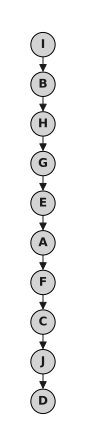

In [45]:
visualize_graph(chain, show_plot=True, figsize=(1,6))

In [46]:
graph = generate_continuous_graph(num_vars=10,
                                  connected=True,
                                  graph_func=generate_random_graph,
                                  edge_prob=0.2)

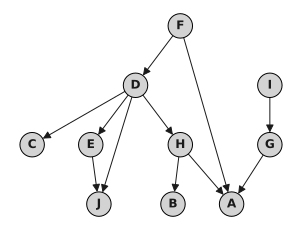

In [47]:
visualize_graph(graph, show_plot=True, figsize=(4,3))

In [48]:
graph.sample(batch_size=12)

{'F': array([-1.67378924, -2.11442968, -1.03905432, -0.52187938,  1.54783902,
        -2.76709587,  0.43015022,  0.20719163, -1.89001606, -0.71426329,
        -1.50526003, -0.73526581]),
 'D': array([ 5.99376435,  3.58418017,  3.2931886 ,  1.75314569, -0.18938371,
         1.03633762,  4.05649154,  0.03159965, -0.75103954,  2.59224196,
        -0.15966069,  1.11539071]),
 'C': array([-2.86528072, -3.58986862, -3.31340291, -2.10486699, -2.83153566,
        -2.94318736, -3.47985979, -2.1205331 , -2.1382481 , -2.78915136,
        -2.33964522, -2.99230449]),
 'I': array([-1.66645128, -1.73496907, -2.22312158, -1.35165493, -2.66536435,
        -1.2765398 , -1.87594569, -2.17832024, -1.98331691, -2.03713028,
        -1.21965816, -2.63407247]),
 'E': array([-5.49075491, -4.32081107, -4.35625242, -0.69192894,  1.02481177,
        -0.41792202, -5.18714766, -0.46805707,  0.80703612, -2.55222563,
         0.38442824, -0.577985  ]),
 'G': array([-3.23383015,  2.60636093, -4.4965011 ,  0.4133989 , 

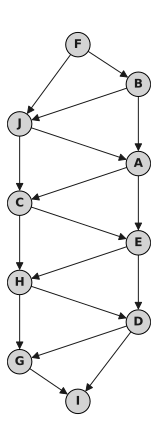

CausalDAG with 10 variables [F,B,J,A,C,E,H,D,G,I] and 17 edges:
F => B,J
B => J,A
J => A,C
A => C,E
C => E,H
E => H,D
H => D,G
D => G,I
G => I



In [49]:
bidiag = generate_categorical_graph(num_vars=10,
                                    min_categs=10,
                                    max_categs=10,
                                    graph_func=generate_bidiag)
visualize_graph(bidiag, show_plot=True, figsize=(2,6))
print(bidiag)

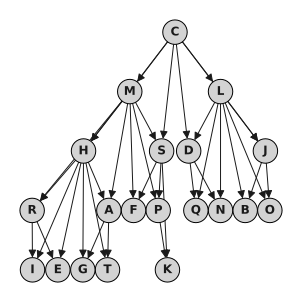

CausalDAG with 20 variables [C,M,L,H,S,D,J,A,R,P,F,N,Q,O,B,T,G,E,I,K] and 36 edges:
C => M,L,H,S,D,J
M => H,S,A,R,P,F
L => D,J,N,Q,O,B
H => A,R,T,G,E,I
S => P,F,K
D => N,Q
J => O,B
A => T,G
R => E,I
P => K



In [50]:
jungle = generate_categorical_graph(num_vars=20,
                                    min_categs=10,
                                    max_categs=10,
                                    graph_func=generate_jungle)
visualize_graph(jungle, show_plot=True, figsize=(4,4))
print(jungle)

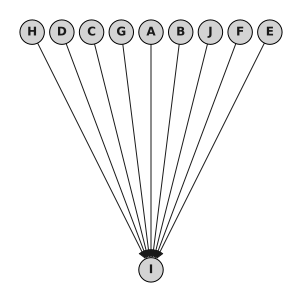

CausalDAG with 10 variables [H,D,C,G,A,B,J,F,E,I] and 9 edges:
H => I
D => I
C => I
G => I
A => I
B => I
J => I
F => I
E => I



In [51]:
collider = generate_categorical_graph(num_vars=10,
                                      min_categs=10,
                                      max_categs=10,
                                      graph_func=generate_collider)
visualize_graph(collider, show_plot=True, figsize=(4,4))
print(collider)

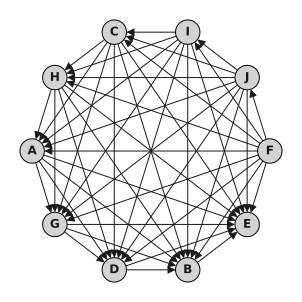

CausalDAG with 10 variables [F,J,I,C,H,A,G,D,B,E] and 45 edges:
F => J,I,C,H,A,G,D,B,E
J => I,C,H,A,G,D,B,E
I => C,H,A,G,D,B,E
C => H,A,G,D,B,E
H => A,G,D,B,E
A => G,D,B,E
G => D,B,E
D => B,E
B => E



In [52]:
full = generate_categorical_graph(num_vars=10,
                                  min_categs=10,
                                  max_categs=10,
                                  graph_func=generate_full)
visualize_graph(full, show_plot=True, figsize=(4,4), layout="circular")
print(full)

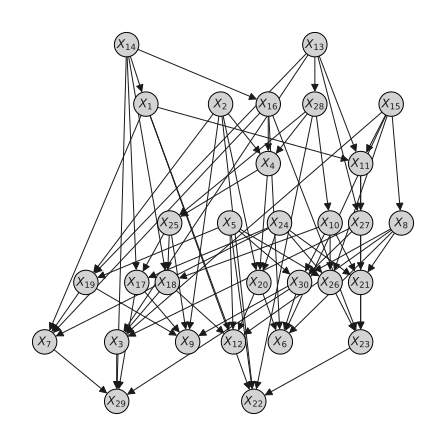

CausalDAG with 30 variables [$X_{13}$,$X_{28}$,$X_{14}$,$X_{10}$,$X_{24}$,$X_{15}$,$X_{2}$,$X_{1}$,$X_{16}$,$X_{4}$,$X_{25}$,$X_{11}$,$X_{5}$,$X_{27}$,$X_{17}$,$X_{19}$,$X_{8}$,$X_{18}$,$X_{30}$,$X_{20}$,$X_{3}$,$X_{21}$,$X_{26}$,$X_{23}$,$X_{9}$,$X_{22}$,$X_{7}$,$X_{29}$,$X_{12}$,$X_{6}$] and 75 edges:
$X_{13}$ => $X_{28}$,$X_{11}$,$X_{27}$,$X_{19}$,$X_{3}$
$X_{28}$ => $X_{10}$,$X_{4}$,$X_{25}$,$X_{22}$
$X_{14}$ => $X_{1}$,$X_{16}$,$X_{17}$,$X_{18}$,$X_{29}$
$X_{10}$ => $X_{18}$,$X_{30}$,$X_{21}$,$X_{26}$
$X_{24}$ => $X_{17}$,$X_{20}$,$X_{21}$,$X_{26}$,$X_{7}$
$X_{15}$ => $X_{11}$,$X_{8}$,$X_{3}$,$X_{26}$,$X_{6}$
$X_{2}$ => $X_{4}$,$X_{19}$,$X_{20}$,$X_{9}$,$X_{22}$
$X_{1}$ => $X_{11}$,$X_{22}$,$X_{7}$,$X_{12}$
$X_{16}$ => $X_{4}$,$X_{23}$,$X_{7}$,$X_{6}$
$X_{4}$ => $X_{25}$,$X_{20}$
$X_{25}$ => $X_{17}$,$X_{18}$,$X_{9}$
$X_{11}$ => $X_{27}$,$X_{23}$
$X_{5}$ => $X_{19}$,$X_{30}$,$X_{26}$,$X_{22}$,$X_{12}$
$X_{27}$ => $X_{30}$,$X_{3}$,$X_{21}$
$X_{17}$ => $X_{9}$,$X_{29}$
$X_{19}$ => $

In [53]:
regular = generate_categorical_graph(num_vars=30,
                                     min_categs=10,
                                     max_categs=10,
                                     graph_func=lambda *args, **kwargs: generate_regular_graph(*args, num_neigh=5, **kwargs))
visualize_graph(regular, show_plot=True, figsize=(6,6), layout="graphviz")
print(regular)

### Loading and saving

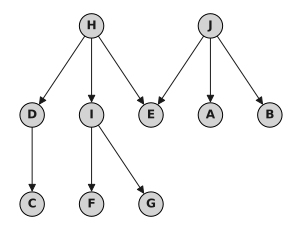

In [54]:
graph = generate_categorical_graph(num_vars=10,
                                   min_categs=10,
                                   max_categs=10,
                                   edge_prob=0.2,
                                   connected=True,
                                   use_nn=True,
                                   seed=42)
visualize_graph(graph, show_plot=True, figsize=(4,3))

In [55]:
graph.get_state_dict()

{'edges': array([[0, 1],
        [0, 3],
        [0, 7],
        [1, 2],
        [3, 4],
        [3, 5],
        [6, 7],
        [6, 8],
        [6, 9]]),
 'variables': [{'name': 'H',
   'prob_dist': {'num_categs': 10,
    'prob_func': {'probs': array([0.1876712 , 0.07749081, 0.04455581, 0.01704923, 0.03453249,
            0.15995144, 0.06149757, 0.04961485, 0.12553785, 0.24209874]),
     'num_categs': 10,
     'class_name': 'LeafCategDist'},
    'class_name': 'CategoricalDist'}},
  {'name': 'D',
   'prob_dist': {'num_categs': 10,
    'prob_func': {'embed_module': OrderedDict([('weight',
                   tensor([[ 0.7421,  0.2900,  0.0877, -1.5774],
                           [-0.1498,  1.2587,  1.4500, -0.0198],
                           [-0.3738, -0.8724,  1.9123,  0.8182],
                           [-1.4142, -0.9412,  0.8517,  1.5665],
                           [ 0.5032,  0.2704, -2.9561, -0.7585],
                           [-0.9140,  1.1534,  1.1489,  0.2410],
               

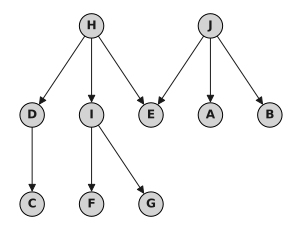

In [56]:
new_graph = CausalDAG.load_from_state_dict(graph.get_state_dict())
visualize_graph(new_graph, show_plot=True, figsize=(4,3))

In [57]:
graph.save_to_file("test_graph.pt")

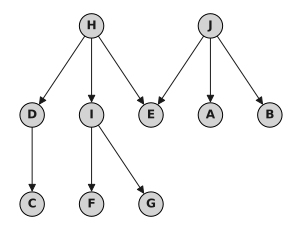

In [58]:
new_graph2 = CausalDAG.load_from_file("test_graph.pt")
visualize_graph(new_graph, show_plot=True, figsize=(4,3))

In [59]:
new_graph.sample(batch_size=12)

{'H': array([1, 8, 0, 8, 5, 9, 0, 4, 0, 9, 9, 1]),
 'D': array([5, 9, 4, 4, 2, 2, 9, 9, 4, 4, 4, 6]),
 'C': array([8, 8, 8, 8, 1, 1, 8, 5, 0, 1, 8, 1]),
 'I': array([0, 7, 9, 7, 1, 7, 1, 1, 9, 7, 7, 7]),
 'F': array([4, 1, 4, 4, 3, 7, 4, 8, 4, 4, 4, 4]),
 'G': array([6, 3, 9, 3, 2, 7, 3, 9, 9, 9, 3, 2]),
 'J': array([8, 3, 9, 9, 8, 2, 2, 8, 2, 2, 5, 8]),
 'E': array([1, 3, 2, 4, 8, 1, 2, 6, 6, 3, 2, 1]),
 'A': array([5, 9, 9, 9, 9, 6, 6, 9, 6, 7, 9, 9]),
 'B': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7])}

In [60]:
graph.variables[0].prob_dist.prob_func.probs

array([0.1876712 , 0.07749081, 0.04455581, 0.01704923, 0.03453249,
       0.15995144, 0.06149757, 0.04961485, 0.12553785, 0.24209874])

In [61]:
new_graph.variables[0].prob_dist.prob_func.probs

array([0.1876712 , 0.07749081, 0.04455581, 0.01704923, 0.03453249,
       0.15995144, 0.06149757, 0.04961485, 0.12553785, 0.24209874])

## Loading real-world datasets

In [62]:
import os
import re
import numpy as np

In [63]:
filename = "real_data/sachs.bif"
with open(filename, "r") as f:
    text = f.read()

variables_str = re.findall("variable .*\{\n?.*\n?\}", text)
variables = dict()
for v_str in variables_str:
    v = dict()
    name = v_str.split("variable ")[1].split("{")[0].strip()
    v["categs"] = [s.strip() for s in v_str.split("{")[-1].split("}")[0].split(",")]
    v["num_categs"] = len(v["categs"])
    variables[name] = v
    
prob_str = re.findall("probability .*\{\n[^}]*\}", text)
probabilities = dict()
edges = []
for p_str in prob_str:
    p = dict()
    bracks = p_str.split("probability (")[1].split(")")[0]
    if "|" in bracks:
        out = bracks.split("|")[0].strip()
        inputs = [s.strip() for s in bracks.split("|")[1].split(",")]
        array_shape = [variables[inp_name]["num_categs"] for inp_name in inputs] + [variables[out]["num_categs"]]
        prob_array = np.zeros(tuple(array_shape), dtype=np.float32)
        
        for l in p_str.split("\n")[1:-1]:
            inp_vals = re.findall("\(.*\)", l)[0][1:-1].split(",")
            inp_indices = [variables[name]["categs"].index(val.strip()) for name, val in zip(inputs, inp_vals)]
            inp_indices = tuple(inp_indices)
            val_str = re.findall("\).*;", l)[0][1:-1]
            prob_array[inp_indices] = np.array([float(v) for v in val_str.split(",")])
    else:
        out, inputs = bracks.strip(), []
        val_str = re.findall("table .*;", p_str)[0][6:-1]
        prob_array = np.array([float(v) for v in val_str.split(",")])
    
    probabilities[out] = CategProduct(input_names=inputs, val_grid=prob_array)
    edges += [[inp, out] for inp in inputs]

variables = [CausalVariable(name, CategoricalDist(variables[name]["num_categs"], probabilities[name])) for name in variables]
var_names = [v.name for v in variables]
edges = [[var_names.index(v) for v in e] for e in edges]
graph = CausalDAG(variables, edges=edges)

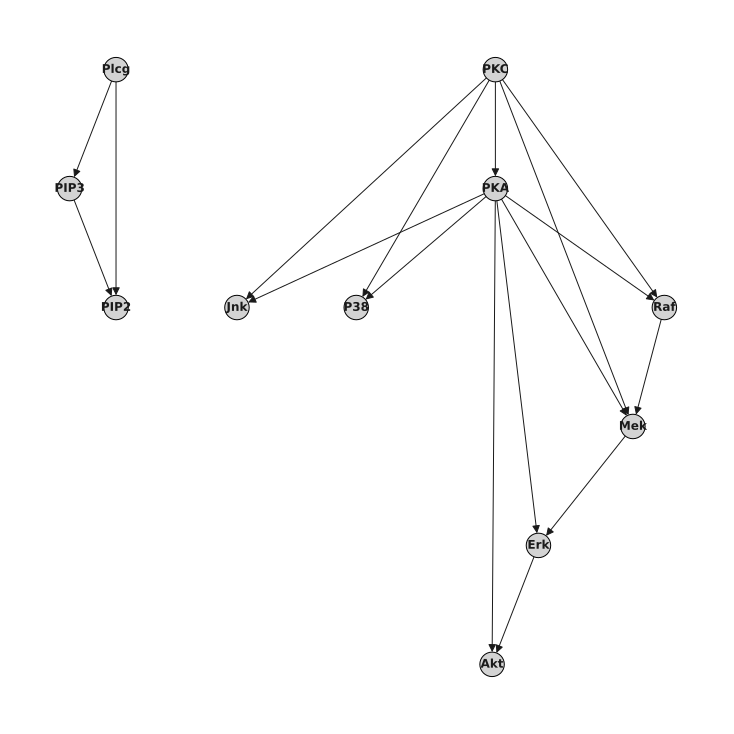

In [64]:
visualize_graph(graph, show_plot=True, figsize=(10,10))

In [65]:
graph.sample(batch_size=12)

{'Plcg': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 'PKC': array([2, 1, 0, 1, 0, 1, 0, 0, 2, 1, 1, 0]),
 'PKA': array([1, 1, 0, 1, 1, 1, 0, 2, 1, 1, 1, 1]),
 'Jnk': array([1, 0, 2, 0, 0, 0, 0, 0, 1, 0, 0, 0]),
 'P38': array([0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0]),
 'Raf': array([0, 0, 2, 0, 1, 1, 2, 0, 0, 0, 0, 2]),
 'Mek': array([0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 'Erk': array([0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
 'Akt': array([1, 1, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0]),
 'PIP3': array([2, 1, 2, 1, 2, 1, 0, 2, 0, 1, 2, 2]),
 'PIP2': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])}

## Testing additional functionalities

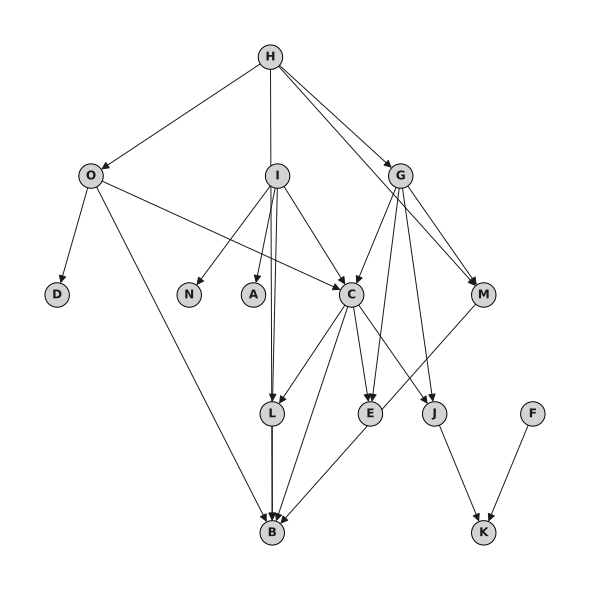

CausalDAG with 15 variables [I,N,H,G,O,M,F,C,J,D,E,L,A,B,K] and 23 edges:
I => N,C,L,A
H => G,O,M,B
G => M,C,J,E
O => C,D,B
M => B
F => K
C => J,E,L,B
J => K
L => B



In [66]:
graph = generate_continuous_graph(num_vars=15,
                                  connected=True,
                                  graph_func=generate_random_graph,
                                  edge_prob=0.2,
                                  seed=42)
visualize_graph(graph, show_plot=True, figsize=(8,8))
print(graph)

In [67]:
graph.node_relations

array([[ 0, -1,  0,  0,  0,  0,  0, -1, -1,  0, -1, -1, -1, -1, -1],
       [ 1,  0,  0,  0,  0,  0,  0,  2,  2,  0,  2,  2,  2,  2,  2],
       [ 0,  0,  0, -1, -1, -1,  0, -1, -1, -1, -1, -1,  0, -1, -1],
       [ 0,  0,  1,  0,  2, -1,  0, -1, -1,  2, -1, -1,  0, -1, -1],
       [ 0,  0,  1,  2,  0,  2,  0, -1, -1, -1, -1, -1,  0, -1, -1],
       [ 0,  0,  1,  1,  2,  0,  0,  2,  2,  2,  2,  2,  0, -1,  2],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1],
       [ 1,  2,  1,  1,  1,  2,  0,  0, -1,  2, -1, -1,  2, -1, -1],
       [ 1,  2,  1,  1,  1,  2,  0,  1,  0,  2,  2,  2,  2,  2, -1],
       [ 0,  0,  1,  2,  1,  2,  0,  2,  2,  0,  2,  2,  0,  2,  2],
       [ 1,  2,  1,  1,  1,  2,  0,  1,  2,  2,  0,  2,  2,  2,  2],
       [ 1,  2,  1,  1,  1,  2,  0,  1,  2,  2,  2,  0,  2, -1,  2],
       [ 1,  2,  0,  0,  0,  0,  0,  2,  2,  0,  2,  2,  0,  2,  2],
       [ 1,  2,  1,  1,  1,  1,  0,  1,  2,  2,  2,  1,  2,  0,  2],
       [ 1,  2,  1,  1,  1,  2,  1

In [68]:
find_nodes_on_paths(graph, 2, 14)

array([ 0.,  0.,  1.,  1.,  1., -1.,  0.,  1.,  1., -1., -1., -1.,  0.,
       -1.,  1.])